# Situación financiera de los municipios

Dic. 04, 2021

Este notebook es un ejemplo del uso de la información contable y presupuestaria de los municipios.

In [1]:
import pandas as pd
import mysql.connector as dbconn
from vega import VegaLite

In [2]:
def load_config():
    lines = open('../config', 'r').readlines()
    config = {}
    for line in lines:
        tokens = line.split()
        if len(tokens) == 2:
            config[tokens[0]] = tokens[1]
        elif len(tokens) == 1:
            config[tokens[0]] = ''
    return config

In [3]:
config = load_config()
config

{'DB_SERVER': 'localhost',
 'DB_PORT': '3306',
 'DB_USER': 'dbadmin',
 'DB_PASS': '',
 'DB_DATABASE': 'cemif'}

In [4]:
def dbconnect():
    conn = dbconn.connect(
        host = config['DB_SERVER'],
        port = config['DB_PORT'],
        user = config['DB_USER'],
        password = config['DB_PASS'],
        database = config['DB_DATABASE']
    )
    return conn

In [47]:
filename = '../client/data/mun-budget-year-header.csv'
budget = pd.read_csv(filename)
budget.head()

,municipality,year,object,moment,amount
0,8101,2010,11,approved,1191000.000
1,8101,2010,12,approved,1599400.000
2,8101,2010,14,approved,94000.000
3,8101,2010,15,approved,552802.000
4,8101,2010,16,approved,476111.625


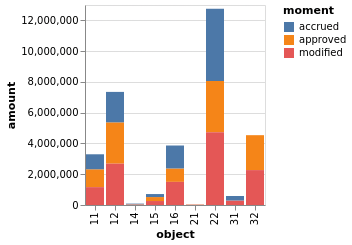

In [51]:
# Ingresos
VegaLite({
    "mark": "bar",
    "encoding": {
        "x": {"field": "object", "type": "nominal"},
        "y": {"field": "amount", "type": "quantitative"},
        "xOffset": {"field": "moment"},
        "color": {"field": "moment"}
    },
    "transform": [
        {"filter": {"field": "object", "lt": "50"}},
        {"filter": {"field": "municipality", "equal": "8101"}},
        {"filter": {"field": "year", "equal": "2020"}}
    ]
}, budget)